In [18]:
import numpy as np
import torch
import ot
from torchdyn.core import NeuralODE
from tqdm import tqdm
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
import pandas as pd
import warnings

###############################preparation##############################################
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

    # 确保 cudnn 不自动优化为不确定性算法
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
def wfr_entropy_cost(source: np.ndarray, target: np.ndarray, delta: float) -> np.ndarray:
    """
    Compute WFR entropy-transport cost matrix based on truncated cosine.

    Parameters:
        source (np.ndarray): shape (n, d)
        target (np.ndarray): shape (m, d)
        delta (float): the WFR interpolation parameter

    Returns:
        cost (np.ndarray): shape (n, m)
    """
    # Pairwise Euclidean distances
    source_sq = np.sum(source**2, axis=1, keepdims=True)
    target_sq = np.sum(target**2, axis=1, keepdims=True).T
    dists = np.sqrt(source_sq - 2 * source @ target.T + target_sq)

    # Compute cost
    z = np.minimum(dists / (2 * delta), np.pi / 2)  # truncated argument
    cos_sq = np.cos(z) ** 2
    cost = -np.log(cos_sq)

    return cost
def compute_uot_plans(X, t_train, reg=0.05, reg_m=[50, np.inf], draw=True, adaptive_reg=True, initial_reg=0.001, verbose=True):
    uot_plans = []
    reg_list = []

    for i in tqdm(range(len(t_train)-1), desc="Computing UOT plans..."):
        X_source = X[i]
        X_target = X[i+1]
        n_source, n_target = X_source.shape[0], X_target.shape[0]
        cost_matrix = ot.dist(X_source, X_target)
        cost_matrix = cost_matrix/cost_matrix.max()
        # cost_matrix = wfr_entropy_cost(X_source, X_target, delta=1)

        a = np.ones(n_source)
        b = np.ones(n_target)

        current_reg = initial_reg if adaptive_reg else reg
        success = False
        max_reg = 1.0

        while not success:
            try:
                with warnings.catch_warnings(record=True) as wlist:
                    warnings.simplefilter("always")  # 捕捉所有 warning

                    G = ot.unbalanced.sinkhorn_unbalanced(a, b, cost_matrix, current_reg, reg_m)

                    # 检查是否有数值类 warning
                    warning_msgs = [str(w.message).lower() for w in wlist]
                    numerical_issue = any(
                        'divide by zero' in msg or 'numerical error' in msg or 'overflow' in msg
                        for msg in warning_msgs
                    )

                    # 检查返回值是否存在 nan/inf
                    bad_output = np.any(np.isnan(G)) or np.any(np.isinf(G))

                    if not numerical_issue and not bad_output:
                        success = True
                    else:
                        raise ValueError("Numerical instability detected")

            except Exception as e:
                if verbose:
                    print(f"[×] reg={current_reg:.4f} failed: {str(e)}")
                current_reg += 0.001
                if current_reg > max_reg:
                    raise RuntimeError(f"Failed to compute UOT between t={i} → t={i+1} even after reg={current_reg:.4f}")

        if verbose:
            print(f"[✓] UOT plan computed for t={i} → t={i+1} with reg={current_reg:.4f}")
        uot_plans.append(G)
        reg_list.append(current_reg)
        
        if draw:
            source_pred = G.sum(1)
            tar_pred = G.sum(0)

            fig = plt.figure(figsize=(15, 5))

            plt.subplot(131)
            plt.plot(a, label=f'source_true_{i}')
            plt.plot(source_pred, label=f'source_pred_{i}')
            plt.legend()

            plt.subplot(132)
            plt.plot(b, label=f'target_true_{i+1}')
            plt.plot(tar_pred, label=f'target_pred_{i+1}')
            plt.legend()

            x0, x1 ,_ = sample_from_ot_plan(uot_plans[i],torch.tensor(X[i]),torch.tensor(X[i+1]),batch_size=400)

            plt.subplot(133)
            plt.scatter(x0[:, 0], x0[:, 1], label='x0')
            plt.scatter(x1[:, 0], x1[:, 1], label='x1')
            for i in range(len(x0)):
                plt.plot([x0[i, 0], x1[i, 0]], [x0[i, 1], x1[i, 1]], color='black', linestyle='--',lw=0.2)
            # print(i)
            plt.legend()

    return uot_plans,reg_list

def sample_map(pi: np.ndarray, batch_size: int = 256, replace: bool = True):
    # 计算行的概率分布
    row_sums = pi.sum(axis=1)
    total_sum = row_sums.sum()
    row_probs = row_sums / total_sum  # 计算 i 的概率

    # 先根据行概率分布采样 i
    i_samples = np.random.choice(pi.shape[0], p=row_probs, size=batch_size, replace=replace)

    # 计算每个 i 对应行的 j 采样
    j_samples = np.zeros(batch_size, dtype=int)
    for idx, i in enumerate(i_samples):
        # 计算当前行的 j 采样概率
        row_p = pi[i] / row_sums[i]  # 归一化，保证概率和为 1
        j_samples[idx] = np.random.choice(pi.shape[1], p=row_p)

    return i_samples, j_samples


def sample_from_ot_plan(ot_plan: np.ndarray, x0: torch.Tensor, x1: torch.Tensor, batch_size: int = 256):
    i, j = sample_map(ot_plan, batch_size, replace=False)
    return x0[i], x1[j], i  # 只返回索引 i

In [19]:
set_seed(0)

In [21]:
# data_type = 'eb'
# data_type = 'cite'
# data_type = 'simulation_gene_data'
# data_type = 'mouse_hematopoiesis'
# data_type = 'mouse2'
# data_type = 'pancrease_1000d_v2'
data_type = 'mef_pca50'
# data_type = 'pancrease_50d_pca'
# data_type = 'pan_pca_100d'
# data_type = 'MEF_v1'
# data_type = 'pancrease_2000d_no_1'
# data_type = 'emt_1000_hvg'
# data_type = 'gaussian_100d'
# data_type = 'finetune_gf_umap'
# data_type = 'dygen'

dim = 2000
hold_out = None
df = pd.read_csv(f'../data/{data_type}.csv')
sample_sizes = df.groupby('samples').size()
print(sample_sizes)
time_labels = df['samples'].to_numpy()
data = df.iloc[:, 1:].to_numpy()
X = [data[time_labels == t] for t in np.unique(time_labels)]
X_selected = [data[time_labels == t] for t, v in enumerate(np.unique(time_labels)) if v != hold_out]
t_train = [i for i, v in enumerate(np.unique(time_labels)) if v != hold_out]


samples
0     4556
1     3449
2     3648
3     1956
4     6981
5     6734
6     6777
7     7355
8     8962
9     7127
10    7227
11    6550
12    8422
13    3111
14    6507
15    5061
16    3815
17    3829
18    3573
19    3088
20    2982
21    2266
22    2051
23    1941
24    2238
25    2164
26    2429
27    2253
28    2145
29    2034
30    3758
31    2723
32    3717
33    4851
34    3422
35    4645
36    3678
37    4068
38    3799
dtype: int64


In [5]:
# unique_times = np.sort(np.unique(time_labels))
# mapping = {val: idx for idx, val in enumerate(unique_times)}
# df['samples'] = df['samples'].map(mapping)
# df.to_csv(f'../data/mef_v2.csv', index=False)

In [6]:
df

,cell_type,branch,samples,Ctrb1,Pnliprp1,Clps,Pyy,Cpa1,Malat1,Chgb,...,Sulf2,Arl4a,Pbxip1,Tcf7l2,Dtx3,Hspb1,Nusap1,Btg3,Aurka,Il10rb
0,Beta,0,0,3.717023,0.000000,2.279082,6.912693,0.000000,10.251488,4.974458,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.437941
1,Acinar,2,0,4.007041,3.214371,3.763014,1.279916,3.074543,3.620895,0.784777,...,0.495139,0.000000,0.0,0.784777,0.000000,0.495139,0.000000,0.000000,0.495139,0.000000
2,Acinar,2,0,1.864270,1.477399,1.308417,0.738699,2.371100,2.694503,0.000000,...,0.466067,0.000000,0.0,0.932135,0.466067,0.738699,0.466067,0.000000,0.932135,0.000000
3,Beta,0,0,2.443856,1.629238,1.629238,2.920378,1.629238,6.526097,3.396899,...,0.000000,0.814619,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,Fev+ Beta,0,0,0.970503,1.538211,0.970503,1.941007,0.970503,6.170025,5.585137,...,0.000000,0.970503,0.0,0.000000,0.000000,0.000000,0.000000,0.970503,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18370,Ductal,2,1,5.520655,3.380276,3.112498,0.000000,2.795784,7.453035,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.204078,0.000000,0.000000
18371,Acinar,2,1,4.926593,4.835765,4.322890,1.179245,4.219582,3.313142,0.000000,...,0.000000,0.507873,0.0,0.000000,0.000000,0.507873,1.425780,0.804960,1.312833,0.507873
18372,Alpha,0,1,3.410840,2.752826,2.752826,4.394247,1.179083,5.681028,0.743919,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.179083
18373,Epsilon,0,1,4.275737,2.557335,2.967937,5.979793,0.989312,8.381132,0.000000,...,0.000000,0.989312,0.0,0.000000,0.000000,0.000000,0.000000,1.568023,0.000000,0.000000


In [8]:
# # 除了 samples 列的其他列
# other_cols = df.columns.drop('samples')

# # 按方差从小到大排序后得到列名
# sorted_cols = df[other_cols].var().sort_values().index.tolist()

# # 重新排列 DataFrame
# df_sorted = pd.concat([df[['samples']], df[sorted_cols]], axis=1)

# df_sorted


In [191]:
df_sorted.describe()

,samples,x39,x8,x634,x697,x395,x1202,x1477,x1238,x940,...,x959,x1036,x287,x1285,x1455,x1254,x543,x982,x1125,x748
count,165892.000000,165892.000000,165892.000000,165892.000000,165892.000000,165892.000000,165892.000000,165892.000000,165892.000000,165892.000000,...,165892.000000,165892.000000,165892.000000,165892.000000,165892.000000,165892.000000,165892.000000,165892.000000,165892.000000,165892.000000
mean,16.506974,0.000105,0.000121,0.000107,0.000123,0.000147,0.000145,0.000185,0.000185,0.000194,...,2.620201,2.205088,2.659267,2.215756,3.400649,3.188725,2.425802,2.718993,1.883532,1.969360
std,11.245146,0.016407,0.017652,0.018270,0.019544,0.021575,0.021616,0.022147,0.023149,0.024476,...,2.276367,2.301987,2.344585,2.347831,2.352044,2.358143,2.364258,2.378060,2.468463,2.473293
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.272633,0.000000,3.316975,1.752253,4.062903,3.987317,2.806513,3.423402,0.000000,0.000000
75%,26.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,4.650401,4.520800,4.816498,4.456986,5.314423,5.124202,4.650401,4.927155,4.029781,4.101867
max,38.000000,3.181991,2.840775,4.112843,3.707090,4.261694,4.480366,3.266548,4.112843,4.368827,...,7.433159,7.396721,7.310051,7.924787,8.306005,8.424850,7.488133,7.447335,8.226926,8.102671


In [156]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib import cm
from matplotlib.colors import Normalize

def plot_X_selected(X_selected, t_train, title="X_selected Scatter Plot", save_path=None):
    """
    可视化 X_selected 中的散点图（按时间段上色）

    Args:
        X_selected: list of np.ndarray, 每个数组是某个时间点的样本 [n_samples, dim]
        t_train: list of int，对应时间点的索引
        title: 图标题
        save_path: 如果设置路径，则保存图片而不展示
    """
    # assert X_selected[0].shape[1] == 2, "仅支持二维可视化"

    norm = Normalize(vmin=min(t_train), vmax=max(t_train))
    cmap = cm.get_cmap('viridis')
    plt.figure(figsize=(8, 6), dpi=120)

    for i, (X_t, t) in enumerate(zip(X_selected, t_train)):
        color = cmap(norm(t))  # t 被映射到 0~1，再传给 cmap 得到颜色
        plt.scatter(X_t[:, 0], X_t[:, 1], alpha=0.5, s=20, label=f"T{t}", color=color)

    plt.xlabel("x1")
    plt.ylabel("x2")
    # plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.axis('off')

    if save_path:
        plt.savefig(save_path)
        print(f"[✓] Saved to {save_path}")
    else:
        plt.show()


/tmp/ipykernel_122313/646873173.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis')


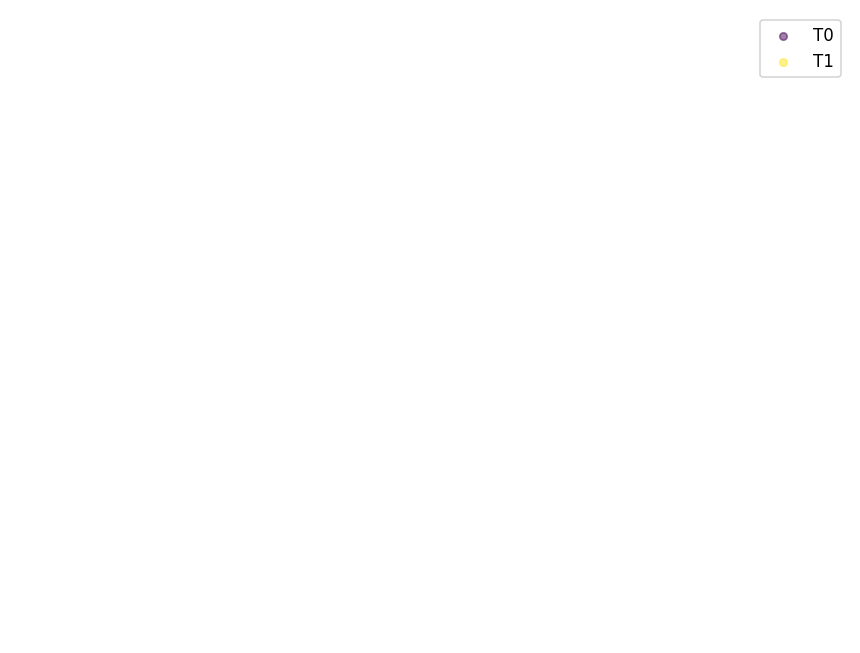

In [150]:
plot_X_selected(X_selected, t_train)

100%|██████████| 10/10 [00:19<00:00,  1.95s/it]


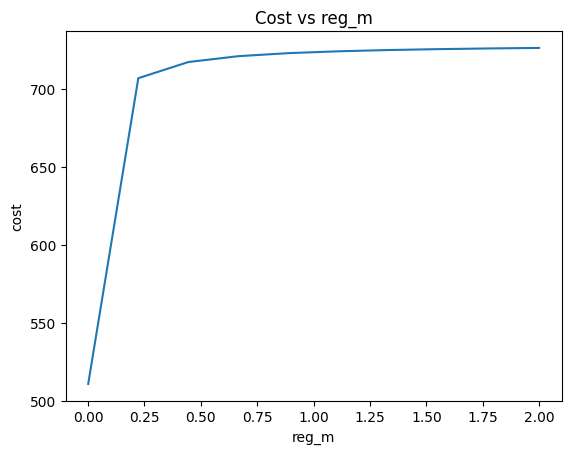

In [23]:
import numpy as np
import ot
import os
import logging
from tqdm import tqdm
import matplotlib.pyplot as plt

# 设置日志配置
log_dir = f'params/{data_type}'
os.makedirs(log_dir, exist_ok=True)
log_file = os.path.join(log_dir, f'log_{dim}.txt')
logging.basicConfig(filename=log_file, level=logging.INFO, 
                    format='%(asctime)s - %(message)s')

# regms = [1,2,4,8,16,32,64,128,256]
regms = list(np.linspace(0.001, 2, 10))
cost_list = []

i = 0
for reg_m in tqdm(regms):
    logging.info(f'{i} to {i+1}')
    X_source = X[i]
    X_target = X[i+1]
    n_source, n_target = X_source.shape[0], X_target.shape[0]
    cost_matrix = ot.dist(X_source, X_target)
    cost_matrix = cost_matrix / cost_matrix.max()
    a = np.ones(n_source)
    b = np.ones(n_target)
    
    cost = ot.unbalanced.sinkhorn_unbalanced2(a, b, cost_matrix, reg=0.005, reg_m=[reg_m, np.inf])
    cost_list.append(cost)
    
    # 记录日志
    logging.info(f"reg_m: {reg_m}, cost: {cost}")

# 绘制并保存图像
plt.plot(regms, cost_list)
plt.xlabel('reg_m')
plt.ylabel('cost')
plt.title('Cost vs reg_m')
plt.savefig(os.path.join(log_dir, 'cost_vs_regm.png'))
plt.show()


In [106]:
X[0].shape

(8403, 1000)

100%|██████████| 10/10 [00:02<00:00,  3.36it/s]


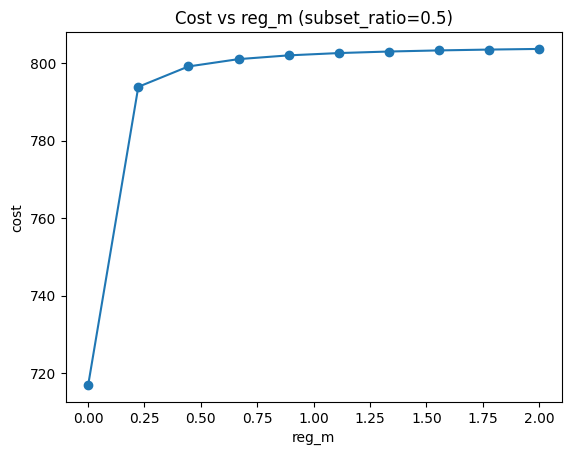

100%|██████████| 10/10 [00:02<00:00,  3.88it/s]


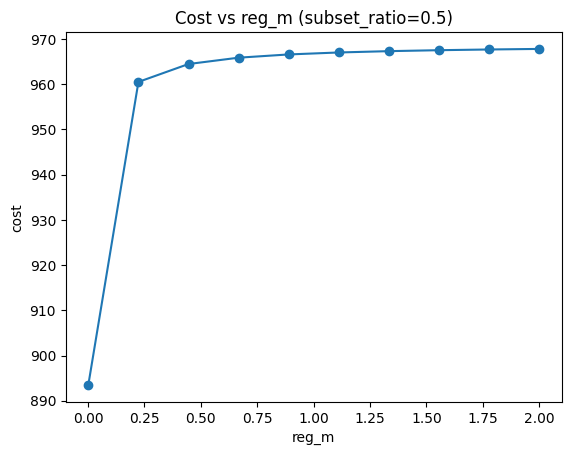

100%|██████████| 10/10 [00:01<00:00,  5.77it/s]


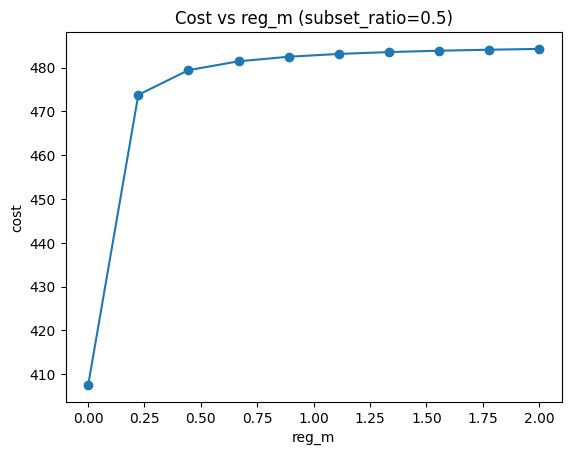

100%|██████████| 10/10 [00:02<00:00,  3.39it/s]


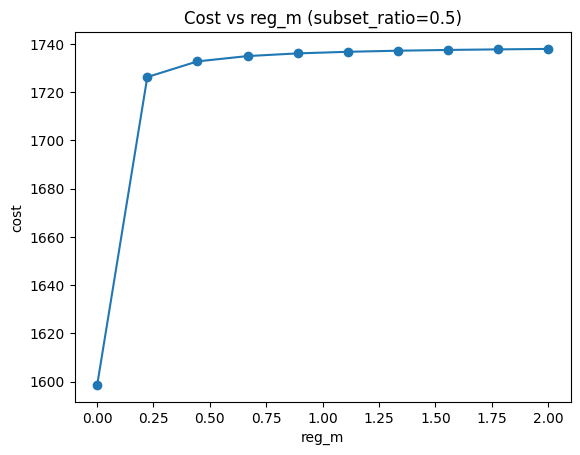

100%|██████████| 10/10 [00:10<00:00,  1.02s/it]


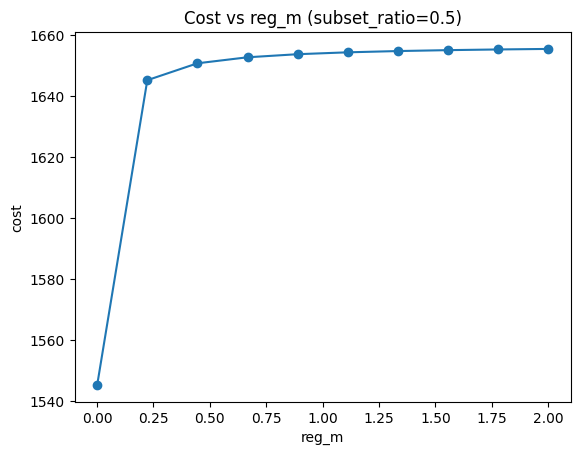

100%|██████████| 10/10 [00:09<00:00,  1.05it/s]


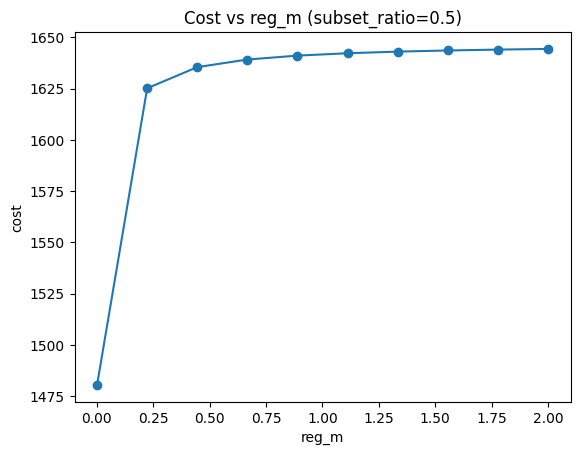

100%|██████████| 10/10 [00:11<00:00,  1.12s/it]


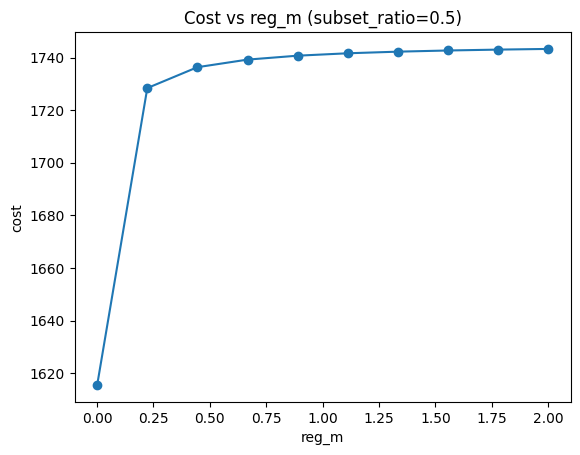

100%|██████████| 10/10 [00:22<00:00,  2.26s/it]


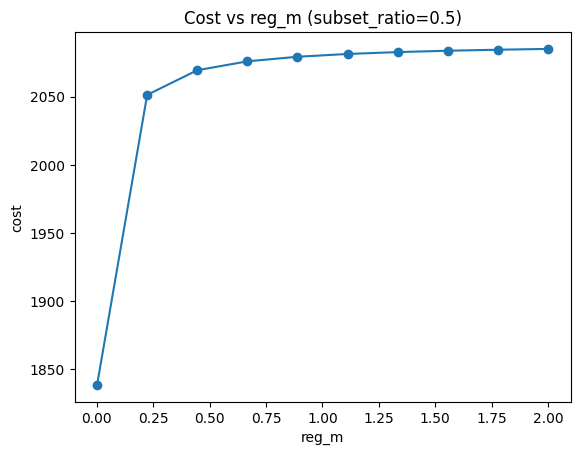

100%|██████████| 10/10 [00:18<00:00,  1.80s/it]


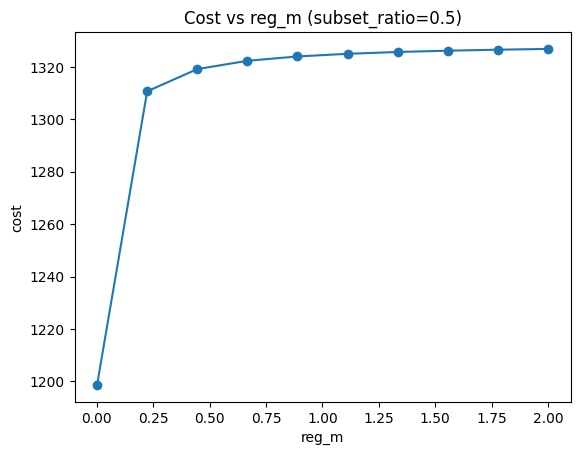

100%|██████████| 10/10 [00:12<00:00,  1.22s/it]


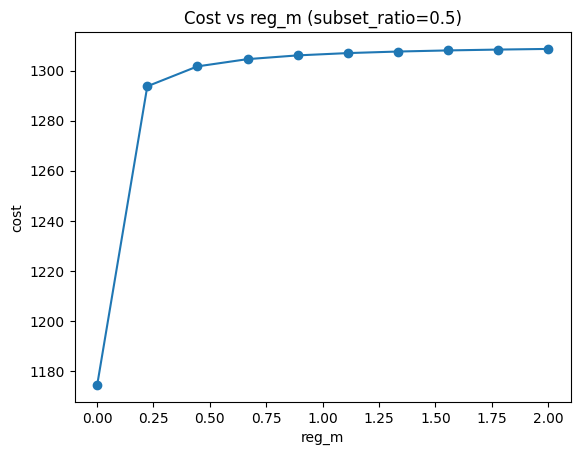

100%|██████████| 10/10 [00:10<00:00,  1.06s/it]


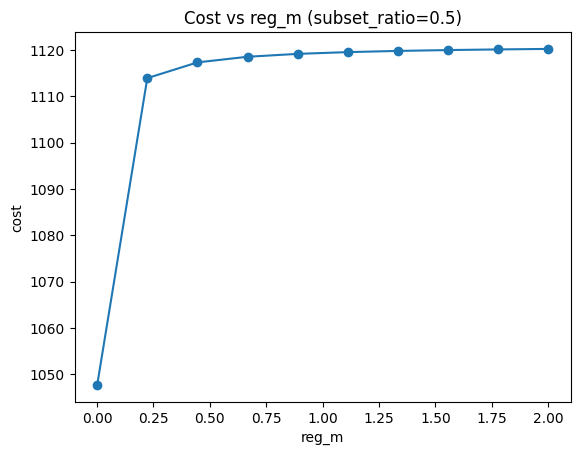

100%|██████████| 10/10 [00:12<00:00,  1.30s/it]


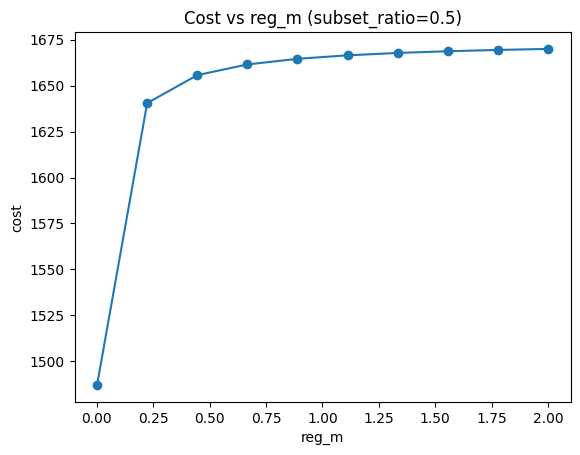

100%|██████████| 10/10 [00:04<00:00,  2.09it/s]


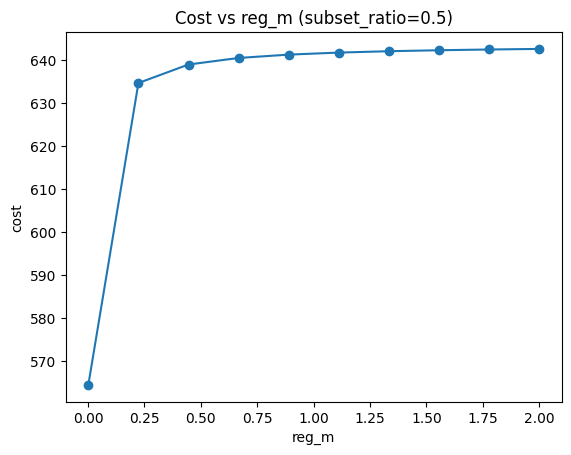

100%|██████████| 10/10 [00:04<00:00,  2.11it/s]


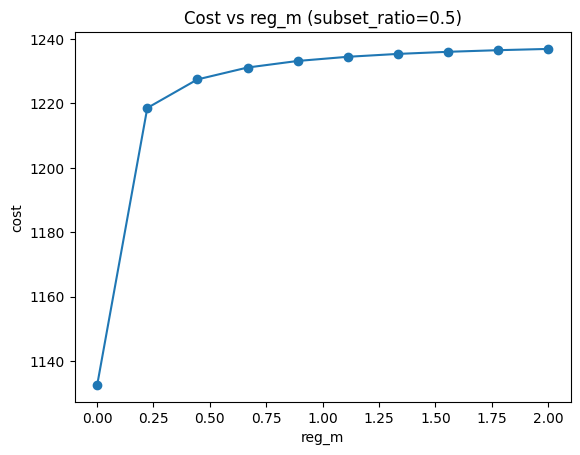

100%|██████████| 10/10 [00:06<00:00,  1.60it/s]


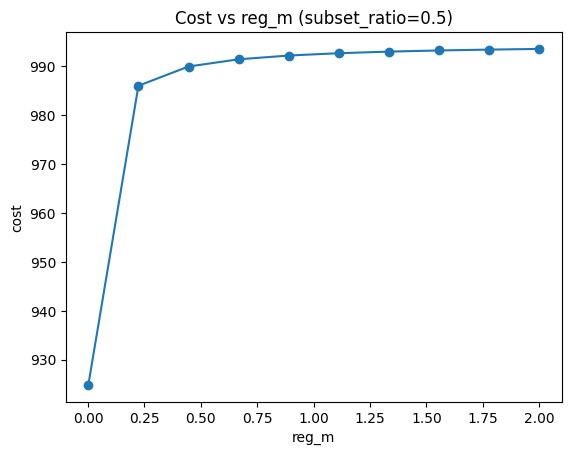

100%|██████████| 10/10 [00:03<00:00,  2.61it/s]


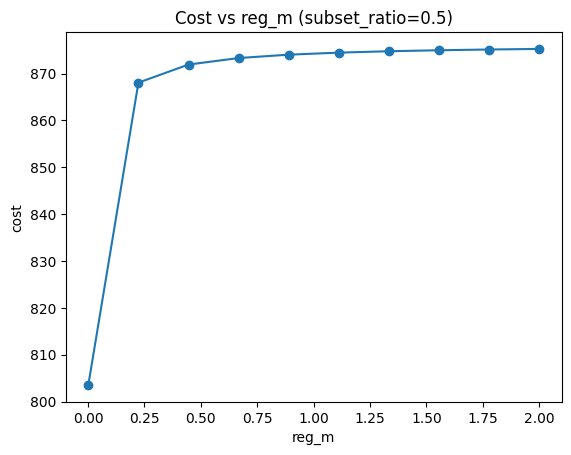

100%|██████████| 10/10 [00:02<00:00,  3.51it/s]


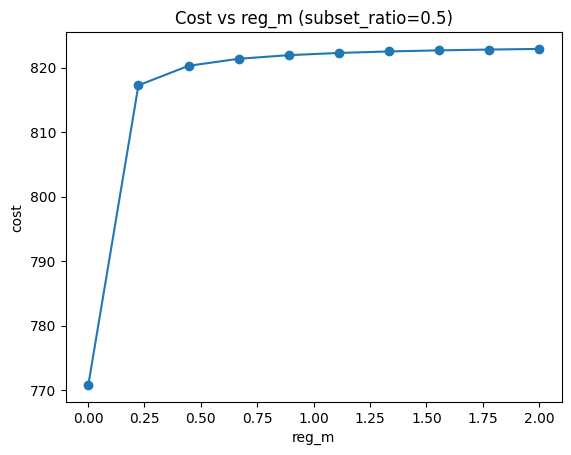

100%|██████████| 10/10 [00:02<00:00,  3.76it/s]


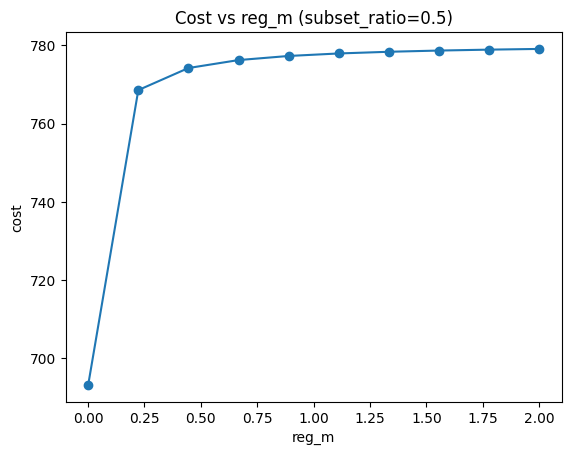

100%|██████████| 10/10 [00:02<00:00,  4.16it/s]


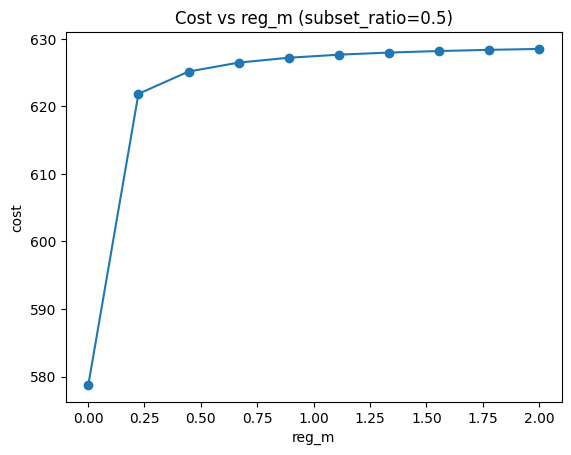

100%|██████████| 10/10 [00:02<00:00,  4.91it/s]


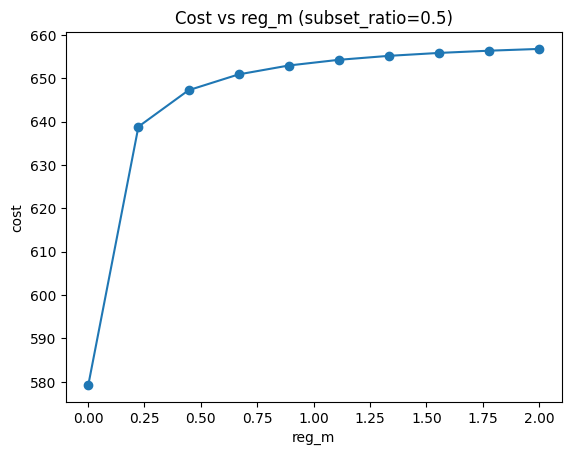

100%|██████████| 10/10 [00:01<00:00,  5.79it/s]


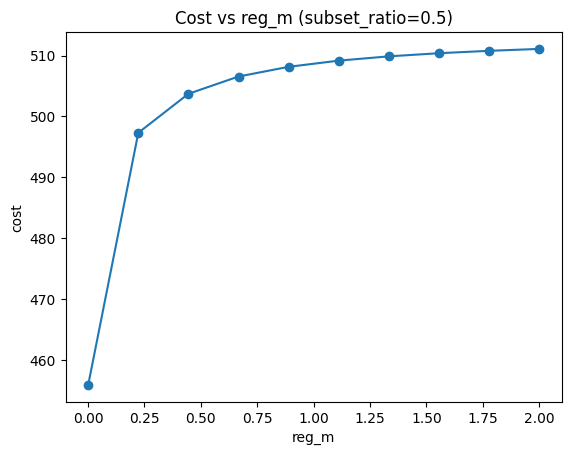

100%|██████████| 10/10 [00:01<00:00,  6.78it/s]


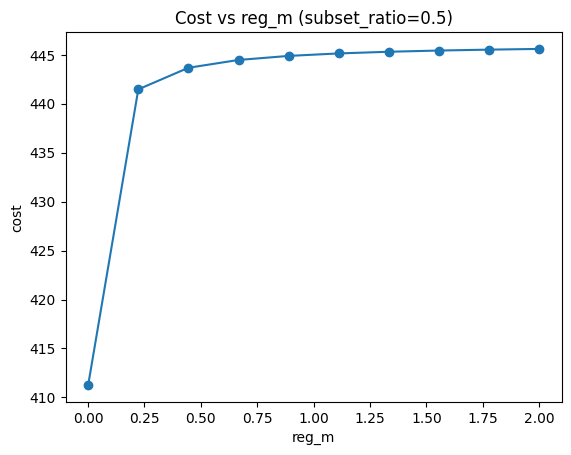

100%|██████████| 10/10 [00:01<00:00,  8.44it/s]


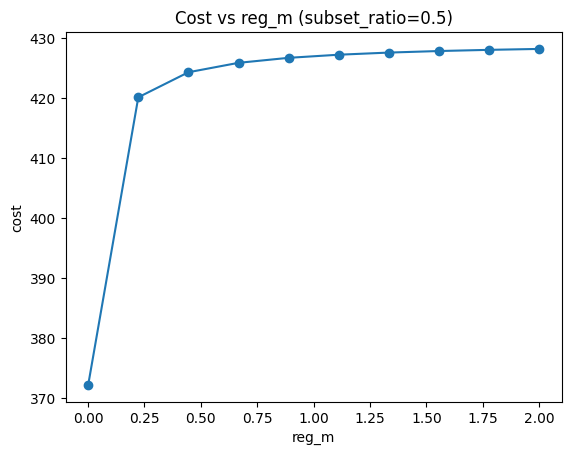

100%|██████████| 10/10 [00:01<00:00,  7.76it/s]


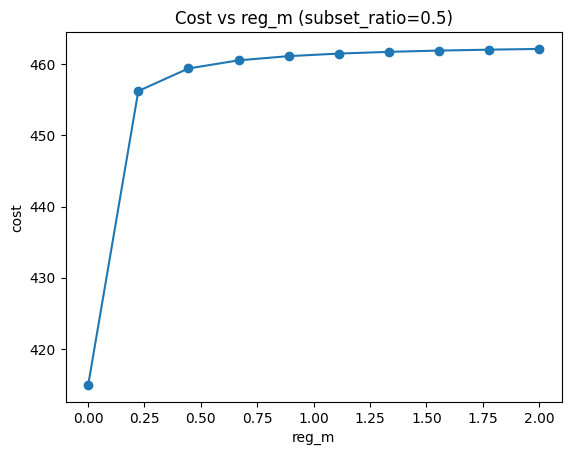

100%|██████████| 10/10 [00:01<00:00,  7.32it/s]


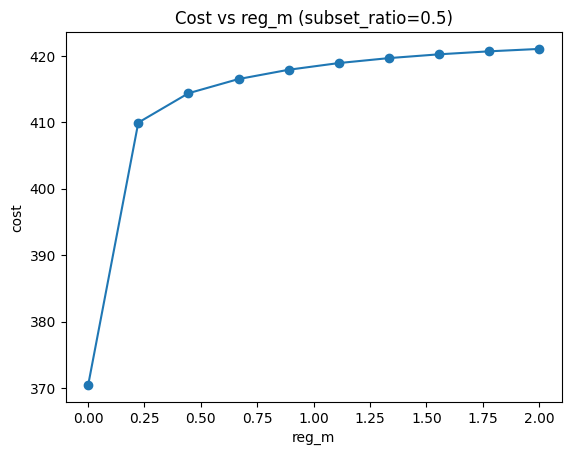

100%|██████████| 10/10 [00:01<00:00,  7.53it/s]


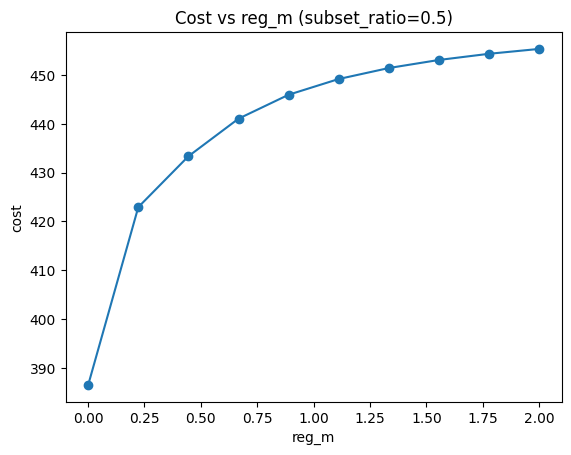

100%|██████████| 10/10 [00:01<00:00,  6.59it/s]


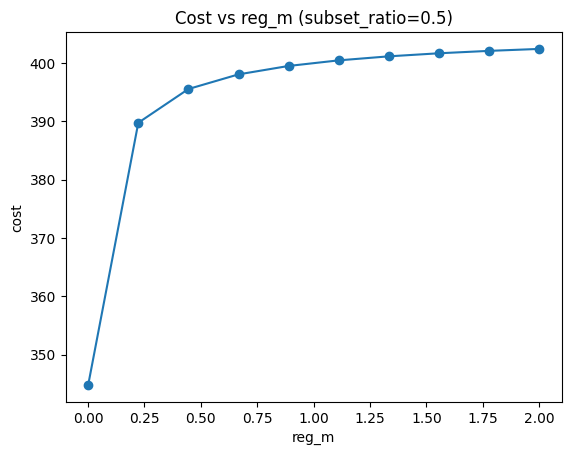

100%|██████████| 10/10 [00:01<00:00,  6.37it/s]


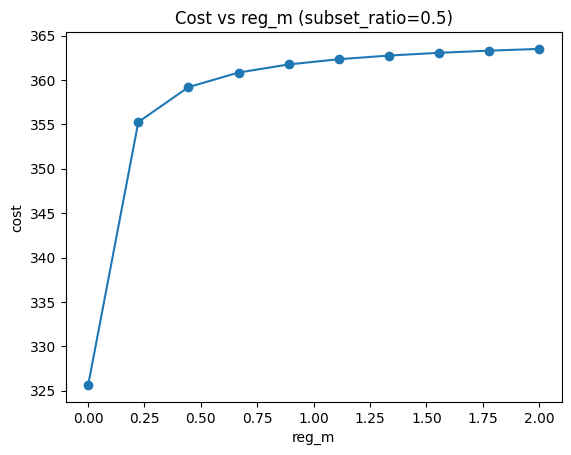

100%|██████████| 10/10 [00:01<00:00,  8.78it/s]


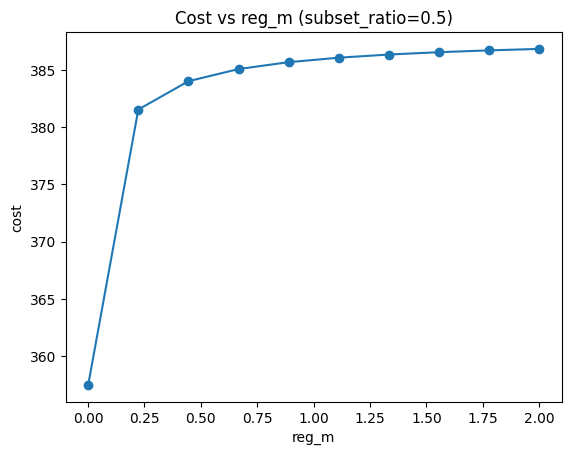

100%|██████████| 10/10 [00:01<00:00,  5.86it/s]


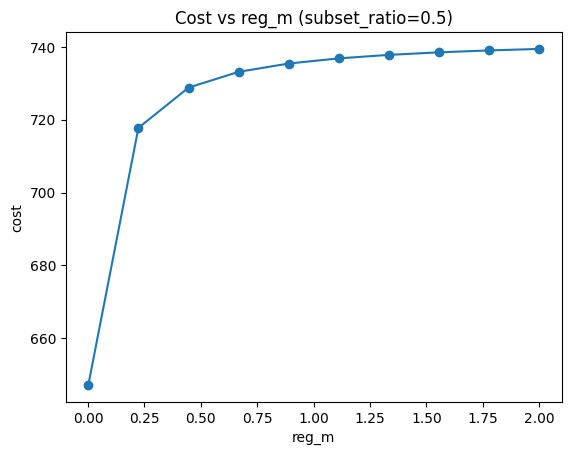

100%|██████████| 10/10 [00:02<00:00,  4.56it/s]


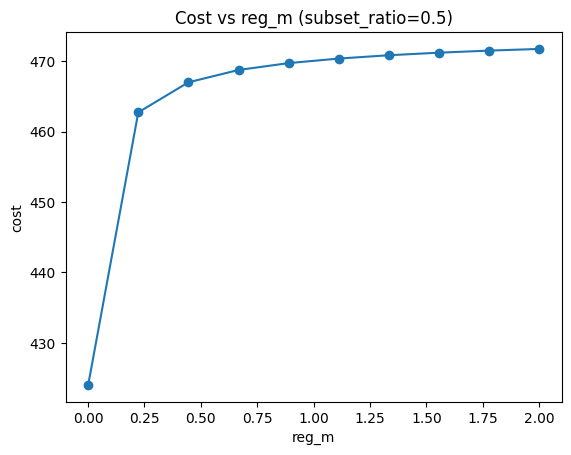

100%|██████████| 10/10 [00:02<00:00,  4.65it/s]


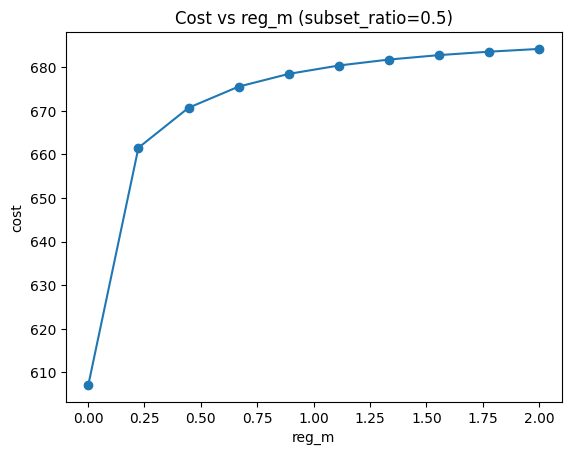

100%|██████████| 10/10 [00:03<00:00,  2.79it/s]


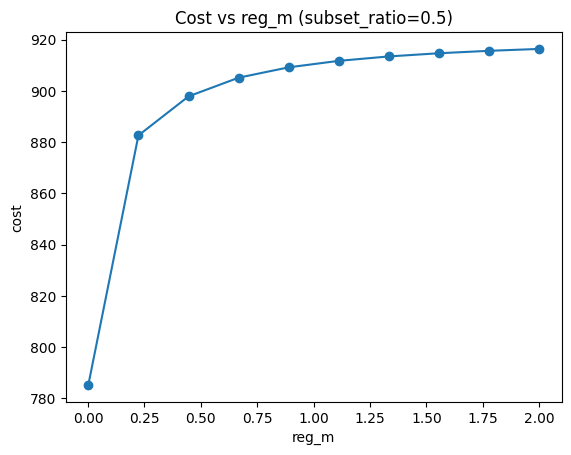

100%|██████████| 10/10 [00:03<00:00,  3.19it/s]


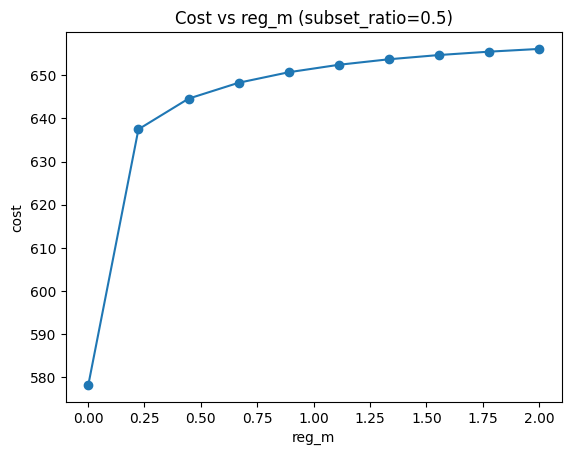

100%|██████████| 10/10 [00:03<00:00,  3.28it/s]


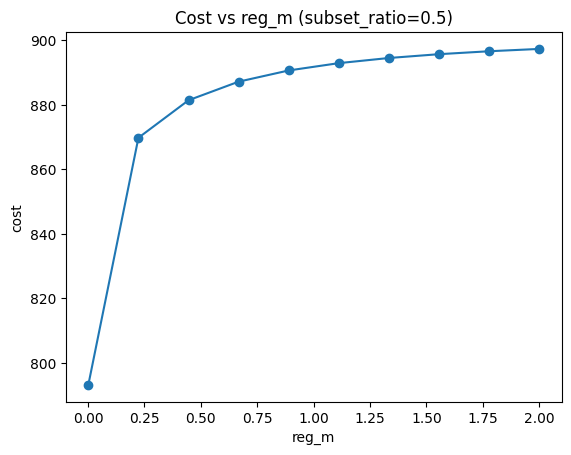

100%|██████████| 10/10 [00:03<00:00,  2.90it/s]


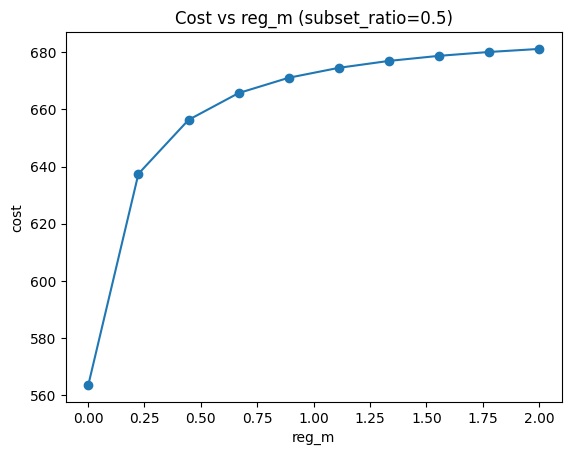

100%|██████████| 10/10 [00:02<00:00,  3.38it/s]


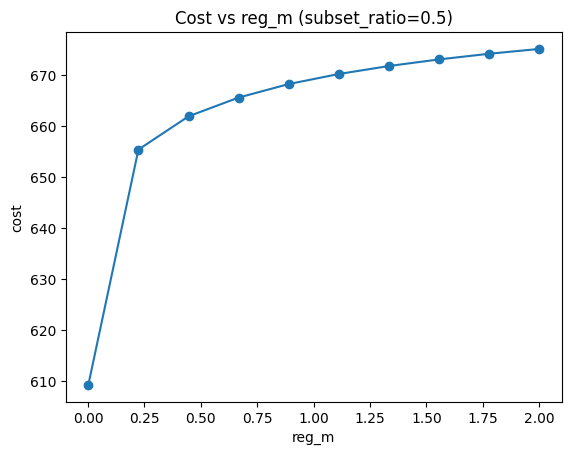

100%|██████████| 10/10 [00:02<00:00,  3.36it/s]


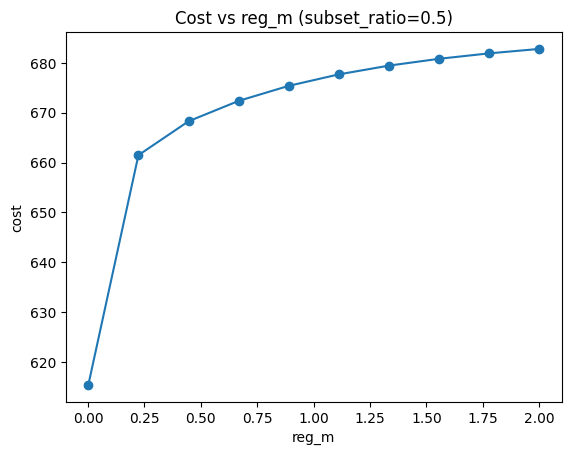

In [180]:
import numpy as np
import ot
import os
import logging
from tqdm import tqdm
import matplotlib.pyplot as plt

# ===== 参数设置 =====
subset_ratio = 0.5   # 抽取比例，例如 0.2 表示 20%
subset_random = True # True 随机采样，False 取前几个
regms = list(np.linspace(0.001, 2, 10))

# ===== 日志目录 =====
log_dir = f'params/{data_type}'
os.makedirs(log_dir, exist_ok=True)
log_file = os.path.join(log_dir, f'log_{dim}.txt')
logging.basicConfig(filename=log_file, level=logging.INFO, 
                    format='%(asctime)s - %(message)s')

cost_list = []
for i in range(len(X)-1):
    logging.info(f"i: {i}")

    # ===== 提取子集 =====
    X_source_full = X[i]
    X_target_full = X[i+1]

    # 子集大小按比例计算
    subset_size_source = int(X_source_full.shape[0] * subset_ratio)
    subset_size_target = int(X_target_full.shape[0] * subset_ratio)

    if subset_random:
        idx_source = np.random.choice(X_source_full.shape[0], subset_size_source, replace=False)
        idx_target = np.random.choice(X_target_full.shape[0], subset_size_target, replace=False)
    else:
        idx_source = np.arange(subset_size_source)
        idx_target = np.arange(subset_size_target)

    X_source = X_source_full[idx_source]
    X_target = X_target_full[idx_target]

    n_source, n_target = X_source.shape[0], X_target.shape[0]
    cost_matrix = ot.dist(X_source, X_target)
    cost_matrix = cost_matrix / cost_matrix.max()

    a = np.ones(n_source)
    b = np.ones(n_target)

    # ===== 计算不同 reg_m 下的 OT cost =====
    for reg_m in tqdm(regms):
        logging.info(f"reg_m: {reg_m}")

        cost = ot.unbalanced.sinkhorn_unbalanced2(a, b, cost_matrix, reg=0.005, reg_m=[reg_m, np.inf])
        cost_list.append(cost)
        logging.info(f"reg_m: {reg_m}, cost: {cost}")

    # ===== 绘图 =====
    plt.plot(regms, cost_list, marker='o')
    cost_list = []
    plt.xlabel('reg_m')
    plt.ylabel('cost')
    plt.title(f'Cost vs reg_m (subset_ratio={subset_ratio})')
    plt.savefig(os.path.join(log_dir, 'cost_vs_regm_subset.png'))
    plt.show()


In [13]:
import os
import yaml
import torch
import pandas as pd
import numpy as np

hold_outs=[None]
reg_yaml_path = os.path.join("params", data_type, "reg.yaml")
os.makedirs(os.path.join("params", data_type), exist_ok=True)

# 如果文件已存在，先读取
if os.path.exists(reg_yaml_path):
    with open(reg_yaml_path, 'r') as f:
        reg_data = yaml.safe_load(f) or {}
else:
    reg_data = {}

for hold_out in hold_outs:
    print('data_type:', data_type)
    df = pd.read_csv(f'../data/{data_type}.csv')
    time_labels = df['samples'].to_numpy()
    data = df.iloc[:, 3:].to_numpy()

    X = [data[time_labels == t] for t in np.unique(time_labels)]
    X_selected = [data[time_labels == t] for t, v in enumerate(np.unique(time_labels)) if v != hold_out]
    t_train = [i for i, v in enumerate(np.unique(time_labels)) if v != hold_out]

    print('t_train:', t_train)
    print('hold out:', hold_out)

    reg_m = [10,np.inf]
    uot_plans, reg_list = compute_uot_plans(
        X_selected,
        t_train,
        reg_m=reg_m,
        draw=True,
        adaptive_reg=False,
        initial_reg=0.005,
        verbose=True
    )

    # ✅ 存入 dict
    reg_data[f"hold_out_{hold_out}"] = {
    'dim': dim,
    'reg_list': [float(f"{r:.6f}") for r in reg_list],
    'reg_m': [reg_m[0],'.inf']  # 把 np.inf 转成可 YAML 表达的字符串
}


# 保存到 reg.yaml
with open(reg_yaml_path, 'w') as f:
    yaml.dump(reg_data, f, default_flow_style=False)

print(f"[✓] Saved all reg lists to {reg_yaml_path}")


data_type: pancrease_1000d_v2
t_train: [0, 1]
hold out: None


Computing UOT plans...:   0%|          | 0/1 [00:00<?, ?it/s]


ValueError: zero-size array to reduction operation maximum which has no identity

Computing UOT plans...:   0%|          | 0/38 [00:00<?, ?it/s]

[✓] UOT plan computed for t=0 → t=1 with reg=0.0500


Computing UOT plans...:   3%|▎         | 1/38 [00:01<00:47,  1.28s/it]

[✓] UOT plan computed for t=1 → t=2 with reg=0.0500


Computing UOT plans...:   5%|▌         | 2/38 [00:01<00:33,  1.07it/s]

[✓] UOT plan computed for t=2 → t=3 with reg=0.0500


Computing UOT plans...:   8%|▊         | 3/38 [00:02<00:25,  1.36it/s]

[✓] UOT plan computed for t=3 → t=4 with reg=0.0500


Computing UOT plans...:  11%|█         | 4/38 [00:03<00:27,  1.25it/s]

[✓] UOT plan computed for t=4 → t=5 with reg=0.0500


Computing UOT plans...:  13%|█▎        | 5/38 [00:06<00:51,  1.57s/it]

[✓] UOT plan computed for t=5 → t=6 with reg=0.0500


Computing UOT plans...:  16%|█▌        | 6/38 [00:08<01:01,  1.91s/it]

[✓] UOT plan computed for t=6 → t=7 with reg=0.0500


Computing UOT plans...:  18%|█▊        | 7/38 [00:12<01:12,  2.34s/it]

[✓] UOT plan computed for t=7 → t=8 with reg=0.0500


Computing UOT plans...:  21%|██        | 8/38 [00:15<01:20,  2.68s/it]

[✓] UOT plan computed for t=8 → t=9 with reg=0.0500


Computing UOT plans...:  24%|██▎       | 9/38 [00:19<01:25,  2.96s/it]

[✓] UOT plan computed for t=9 → t=10 with reg=0.0500


Computing UOT plans...:  26%|██▋       | 10/38 [00:22<01:23,  2.98s/it]

[✓] UOT plan computed for t=10 → t=11 with reg=0.0500


Computing UOT plans...:  29%|██▉       | 11/38 [00:24<01:17,  2.88s/it]

[✓] UOT plan computed for t=11 → t=12 with reg=0.0500


Computing UOT plans...:  32%|███▏      | 12/38 [00:27<01:15,  2.92s/it]

[✓] UOT plan computed for t=12 → t=13 with reg=0.0500


Computing UOT plans...:  34%|███▍      | 13/38 [00:29<01:03,  2.52s/it]

[✓] UOT plan computed for t=13 → t=14 with reg=0.0500


Computing UOT plans...:  37%|███▋      | 14/38 [00:30<00:51,  2.15s/it]

[✓] UOT plan computed for t=14 → t=15 with reg=0.0500


Computing UOT plans...:  39%|███▉      | 15/38 [00:32<00:47,  2.08s/it]

[✓] UOT plan computed for t=15 → t=16 with reg=0.0500


Computing UOT plans...:  42%|████▏     | 16/38 [00:34<00:44,  2.01s/it]

[✓] UOT plan computed for t=16 → t=17 with reg=0.0500


Computing UOT plans...:  45%|████▍     | 17/38 [00:35<00:34,  1.66s/it]

[✓] UOT plan computed for t=17 → t=18 with reg=0.0500


Computing UOT plans...:  47%|████▋     | 18/38 [00:36<00:28,  1.41s/it]

[✓] UOT plan computed for t=18 → t=19 with reg=0.0500


Computing UOT plans...:  50%|█████     | 19/38 [00:36<00:22,  1.20s/it]

[✓] UOT plan computed for t=19 → t=20 with reg=0.0500


Computing UOT plans...:  53%|█████▎    | 20/38 [00:37<00:18,  1.01s/it]

[✓] UOT plan computed for t=20 → t=21 with reg=0.0500


/tmp/ipykernel_16541/2050830471.py:105: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(15, 5))
Computing UOT plans...:  55%|█████▌    | 21/38 [00:37<00:14,  1.17it/s]

[✓] UOT plan computed for t=21 → t=22 with reg=0.0500


Computing UOT plans...:  58%|█████▊    | 22/38 [00:38<00:11,  1.42it/s]

[✓] UOT plan computed for t=22 → t=23 with reg=0.0500


Computing UOT plans...:  61%|██████    | 23/38 [00:38<00:08,  1.68it/s]

[✓] UOT plan computed for t=23 → t=24 with reg=0.0500


Computing UOT plans...:  63%|██████▎   | 24/38 [00:38<00:07,  1.91it/s]

[✓] UOT plan computed for t=24 → t=25 with reg=0.0500


Computing UOT plans...:  66%|██████▌   | 25/38 [00:39<00:06,  2.02it/s]

[✓] UOT plan computed for t=25 → t=26 with reg=0.0500


Computing UOT plans...:  68%|██████▊   | 26/38 [00:40<00:07,  1.51it/s]

[✓] UOT plan computed for t=26 → t=27 with reg=0.0500


Computing UOT plans...:  71%|███████   | 27/38 [00:40<00:06,  1.65it/s]

[✓] UOT plan computed for t=27 → t=28 with reg=0.0500


Computing UOT plans...:  74%|███████▎  | 28/38 [00:41<00:05,  1.82it/s]

[✓] UOT plan computed for t=28 → t=29 with reg=0.0500


Computing UOT plans...:  76%|███████▋  | 29/38 [00:41<00:04,  1.96it/s]

[✓] UOT plan computed for t=29 → t=30 with reg=0.0500


Computing UOT plans...:  79%|███████▉  | 30/38 [00:42<00:04,  1.91it/s]

[✓] UOT plan computed for t=30 → t=31 with reg=0.0500


Computing UOT plans...:  82%|████████▏ | 31/38 [00:42<00:03,  1.78it/s]

[✓] UOT plan computed for t=31 → t=32 with reg=0.0500


Computing UOT plans...:  84%|████████▍ | 32/38 [00:43<00:03,  1.70it/s]

[✓] UOT plan computed for t=32 → t=33 with reg=0.0500


Computing UOT plans...:  87%|████████▋ | 33/38 [00:44<00:03,  1.36it/s]

[✓] UOT plan computed for t=33 → t=34 with reg=0.0500


Computing UOT plans...:  89%|████████▉ | 34/38 [00:45<00:03,  1.23it/s]

[✓] UOT plan computed for t=34 → t=35 with reg=0.0500


Computing UOT plans...:  92%|█████████▏| 35/38 [00:46<00:02,  1.16it/s]

[✓] UOT plan computed for t=35 → t=36 with reg=0.0500


Computing UOT plans...:  95%|█████████▍| 36/38 [00:47<00:01,  1.11it/s]

[✓] UOT plan computed for t=36 → t=37 with reg=0.0500


Computing UOT plans...:  97%|█████████▋| 37/38 [00:48<00:00,  1.11it/s]

[✓] UOT plan computed for t=37 → t=38 with reg=0.0500


Computing UOT plans...: 100%|██████████| 38/38 [00:49<00:00,  1.30s/it]


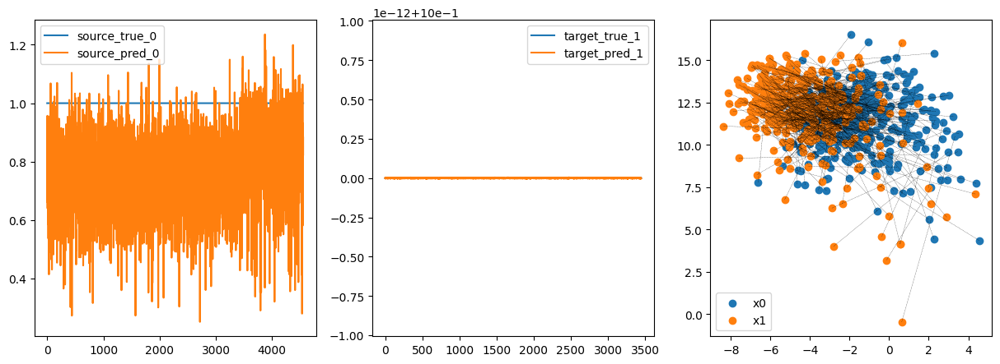

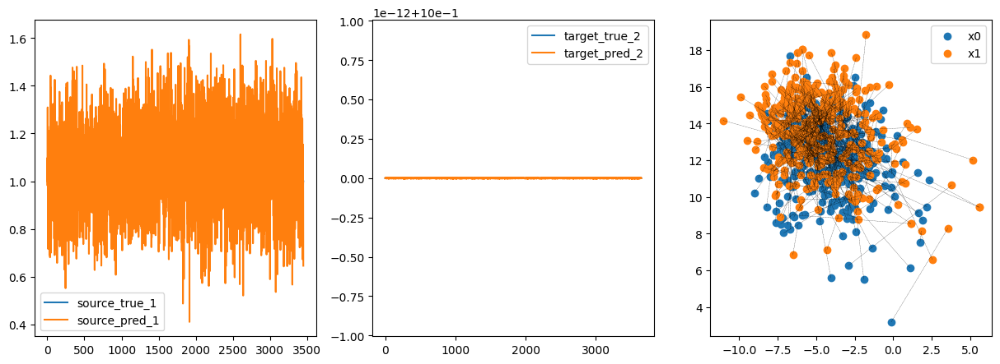

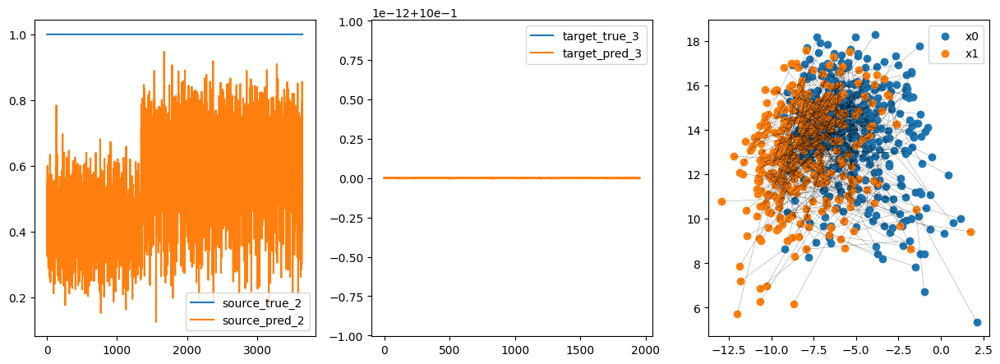

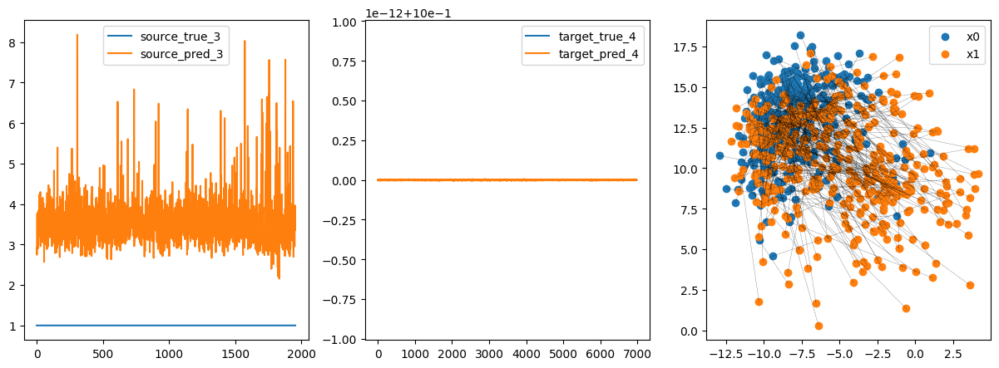

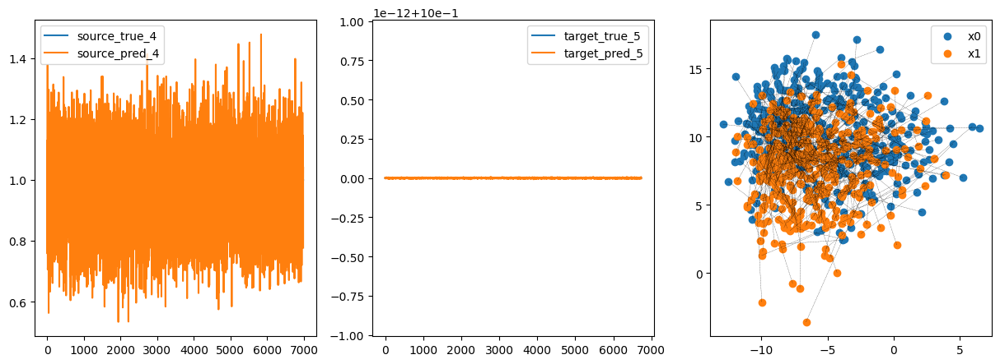

...

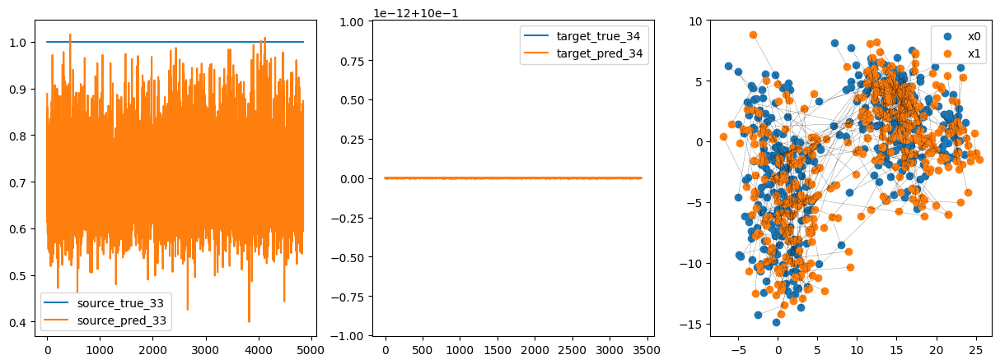

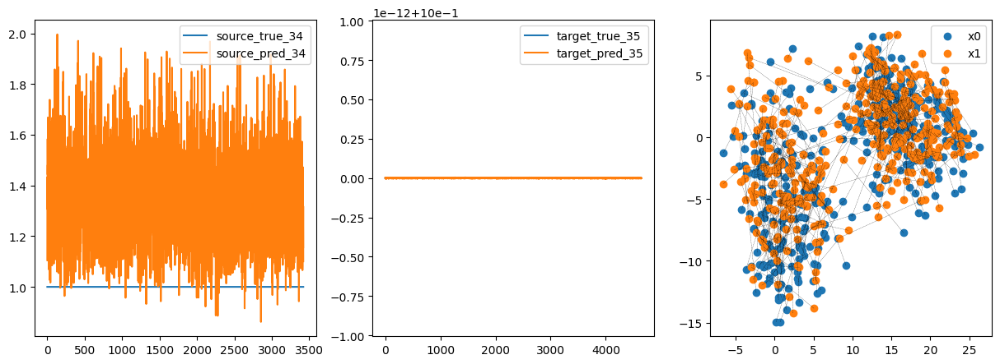

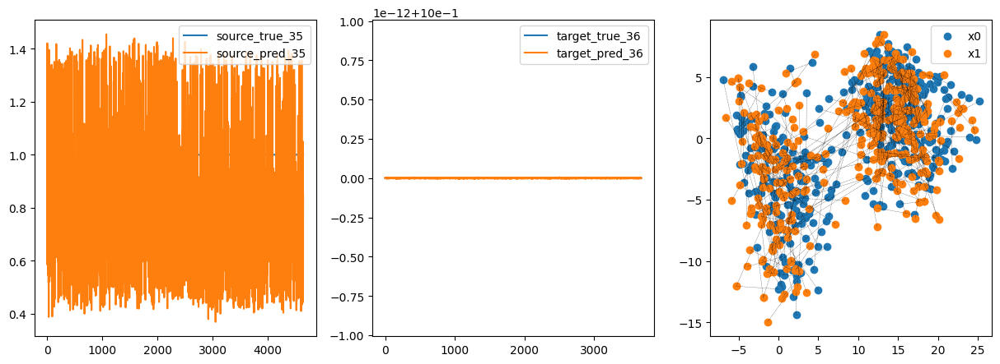

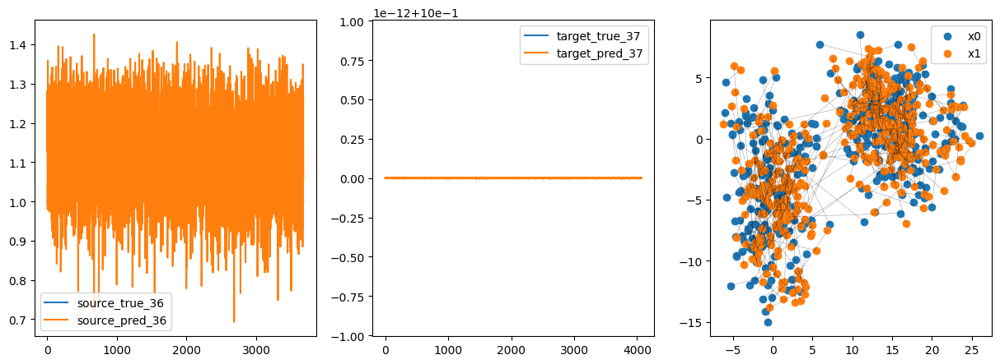

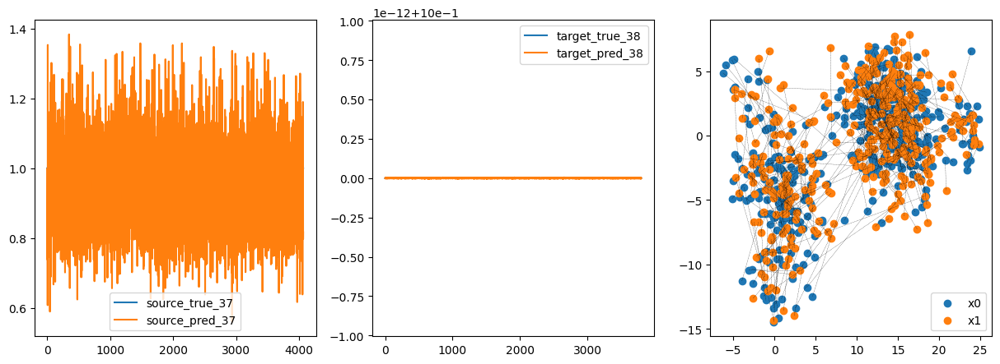

In [24]:
reg_m = [0.2,np.inf]
uot_plans, reg_list = compute_uot_plans(
        X,
        t_train,
        reg_m=reg_m,
        draw=True,
        adaptive_reg=False,
        initial_reg=0.005,
        verbose=True
)

In [10]:
weight = uot_plans[0].sum(1)
branch = df['branch'].iloc[:8403].to_numpy()
cell_type = df['cell_type'].iloc[:8403].to_numpy()
branch,cell_type

(array([0, 2, 2, ..., 1, 2, 2]),
 array(['Beta', 'Acinar', 'Acinar', ..., 'Ngn3 High late', 'Acinar',
        'Acinar'], dtype=object))

In [11]:
df_weight = pd.DataFrame({'weight': weight, 'branch': branch,'cell_type': cell_type})

# 计算每个 branch 的权重加和
weight_sum_by_branch = df_weight.groupby('branch')['weight'].sum()
weight_sum_by_cell_type = df_weight.groupby('cell_type')['weight'].sum()

In [12]:
weight_sum_by_cell_type

cell_type
Acinar            4460.588745
Alpha              641.218127
Beta               610.105003
Delta               31.157028
Ductal            1821.009181
Epsilon             82.708176
Fev+ Alpha          99.561134
Fev+ Beta          857.718299
Fev+ Delta          44.967373
Fev+ Epsilon        49.003356
Ngn3 High late    1077.775591
Tip                196.187987
Name: weight, dtype: float64

In [13]:
df_weight.groupby('branch')['weight'].sum()
df_weight.groupby('branch')['branch'].value_counts()

branch
0    2419
1    1051
2    4933
Name: count, dtype: int64

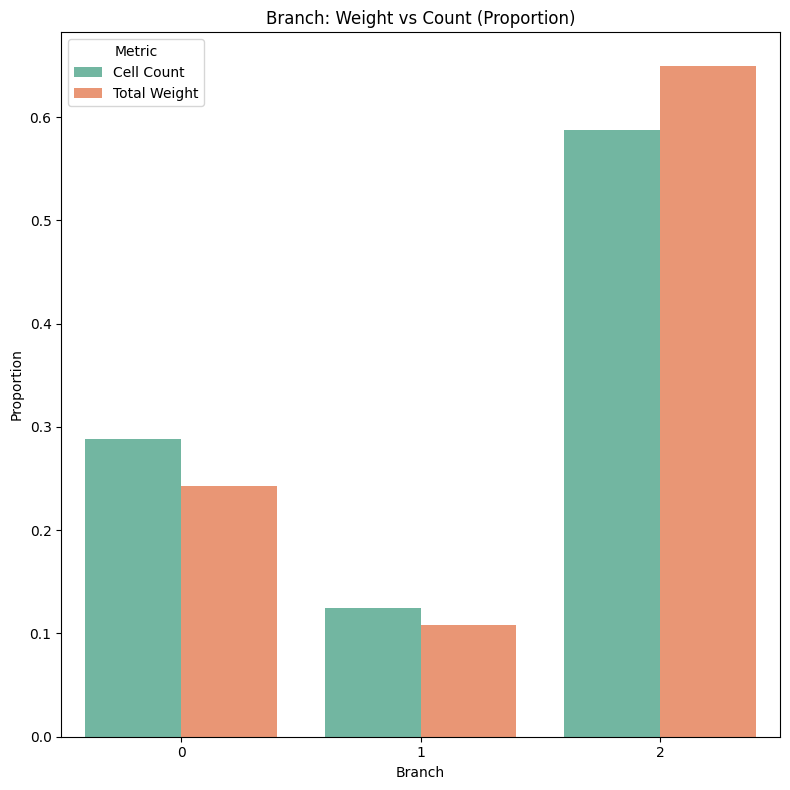

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_branch_weight_and_count_together_ratio(df_weight):
    # 1. 每个 branch 的 weight 总和
    branch_weight_sum = df_weight.groupby('branch')['weight'].sum().reset_index(name='Total Weight')

    # 2. 每个 branch 的 cell 数量
    branch_counts = df_weight.groupby('branch')['branch'].count().reset_index(name='Cell Count')

    # 3. 合并到一个表
    df_plot = pd.merge(branch_weight_sum, branch_counts, on='branch')

    # 4. 转成长格式
    df_plot_long = df_plot.melt(id_vars='branch', 
                                value_vars=['Cell Count', 'Total Weight'],
                                var_name='Metric', value_name='Value')

    # 5. 用 transform 保证索引对齐
    df_plot_long['Ratio'] = df_plot_long.groupby('Metric')['Value'].transform(lambda x: x / x.sum())

    # 6. 绘制比例柱状图
    plt.figure(figsize=(8, 8))
    sns.barplot(data=df_plot_long, x='branch', y='Ratio', hue='Metric', palette='Set2')

    plt.title('Branch: Weight vs Count (Proportion)')
    plt.xlabel('Branch')
    plt.ylabel('Proportion')
    plt.legend(title='Metric')
    plt.tight_layout()
    plt.show()

# 调用
plot_branch_weight_and_count_together_ratio(df_weight)


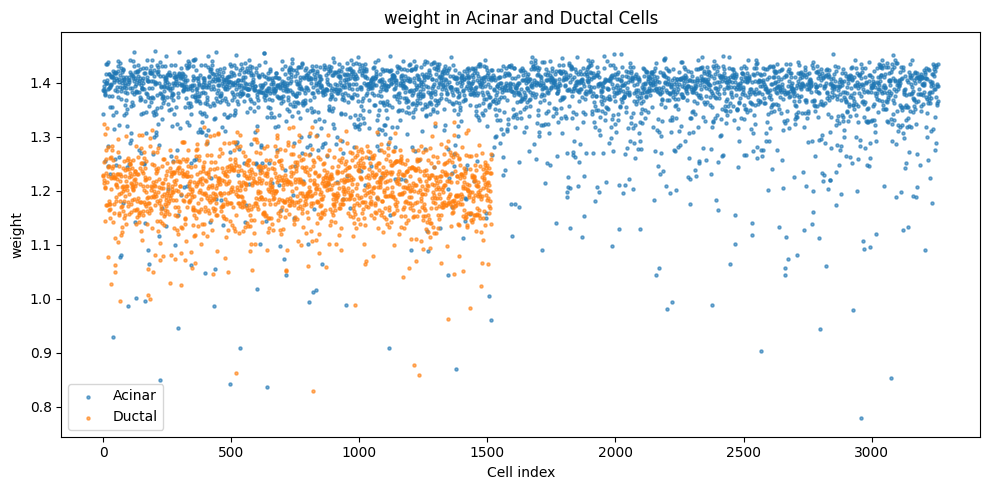

In [15]:
import matplotlib.pyplot as plt
import numpy as np

def plot_acinar_ductal_weight_1d(df, weight_col="weight"):
    df_plot = df[df["cell_type"].isin(["Acinar", "Ductal"])].copy()
    
    cell_types = ["Acinar", "Ductal"]
    colors = ["tab:blue", "tab:orange"]

    plt.figure(figsize=(10, 5))
    
    for i, ct in enumerate(cell_types):
        sub_df = df_plot[df_plot["cell_type"] == ct]
        indices = np.arange(len(sub_df))
        weights = sub_df[weight_col].values
        plt.scatter(indices, weights, s=5, color=colors[i], label=ct, alpha=0.6)
    
    plt.xlabel("Cell index")
    plt.ylabel(f"{weight_col}")
    plt.title(f"{weight_col} in Acinar and Ductal Cells")
    plt.legend()
    plt.tight_layout()
    plt.show()
plot_acinar_ductal_weight_1d(df_weight)



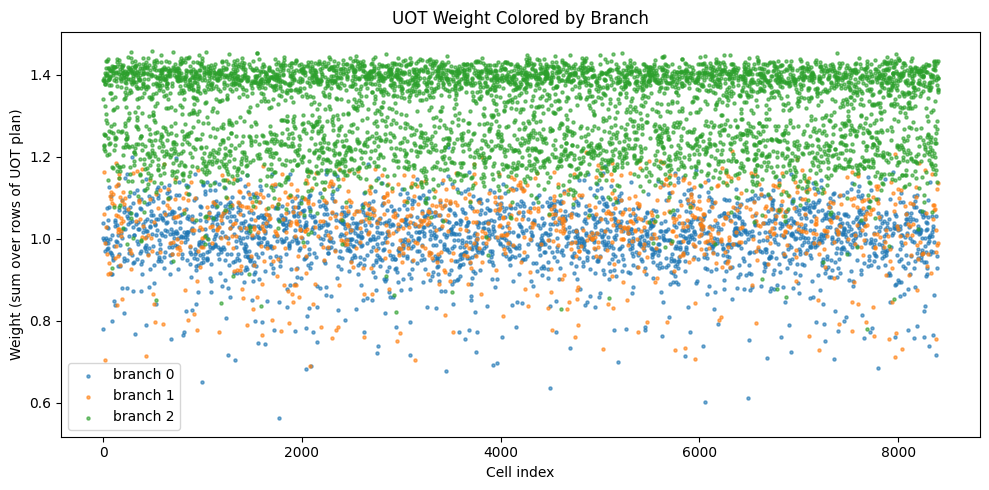

In [16]:
plt.figure(figsize=(10, 5))
colors = ['tab:blue', 'tab:orange', 'tab:green']
labels = ['branch 0', 'branch 1', 'branch 2']
for b in [0, 1, 2]:
    idx = (branch == b)
    plt.scatter(np.arange(len(weight))[idx], weight[idx], s=5, color=colors[b], label=labels[b], alpha=0.6)

plt.xlabel("Cell index")
plt.ylabel("Weight (sum over rows of UOT plan)")
plt.title("UOT Weight Colored by Branch")
plt.legend()
plt.tight_layout()
plt.show()

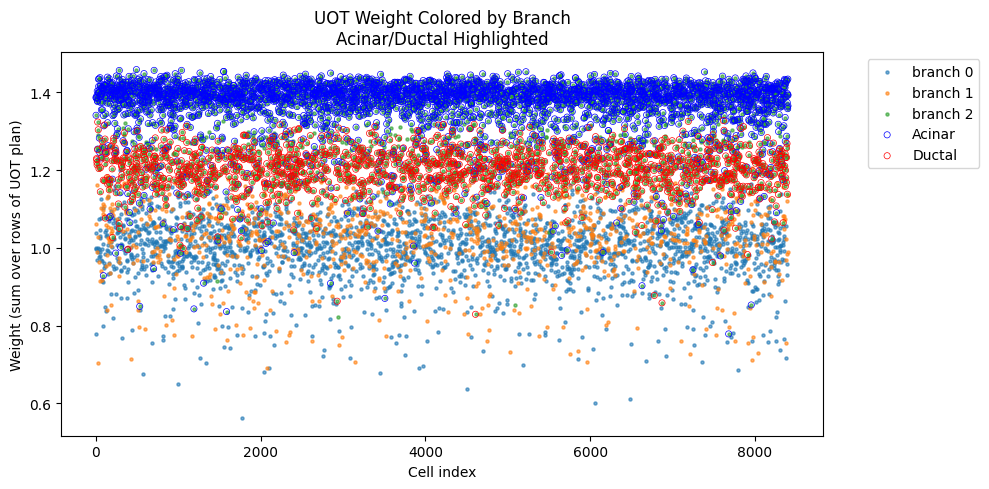

In [17]:
plt.figure(figsize=(10, 5))
colors = ['tab:blue', 'tab:orange', 'tab:green']
labels = ['branch 0', 'branch 1', 'branch 2']

for b in [0, 1, 2]:
    idx = (branch == b)
    plt.scatter(
        np.arange(len(weight))[idx],
        weight[idx],
        s=5,
        color=colors[b],
        label=labels[b],
        alpha=0.6
    )
cell_type_list = df['cell_type'].iloc[:8403].to_numpy()

# 加标记：找到 Acinar 和 Ductal 的索引
for cell_type, edge_color in [('Acinar', 'blue'), ('Ductal', 'red')]:
    idx_type = (cell_type_list == cell_type)  # cell_type_list 是所有细胞的类型序列（长度与 weight 一致）
    plt.scatter(
        np.arange(len(weight))[idx_type],
        weight[idx_type],
        s=20,
        facecolors='none',
        edgecolors=edge_color,
        linewidths=0.5,
        label=f'{cell_type}'
    )

plt.xlabel("Cell index")
plt.ylabel("Weight (sum over rows of UOT plan)")
plt.title("UOT Weight Colored by Branch\nAcinar/Ductal Highlighted")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [51]:
df

,cell_type,branch,samples,Ctrb1,Pnliprp1,Clps,Pyy,Cpa1,Chgb,Malat1,...,Pdlim7,St6galnac2,Phyh,Il10rb,Pbxip1,Slc24a5,Cdc14b,Ncln,Fam110a,Fam213b
0,Beta,0,14.5,3.717023,0.000000,2.279082,6.912693,0.000000,4.974458,10.251488,...,0.000000,1.437941,0.000000,1.437941,0.0,0.000000,0.000000,0.0,1.437941,1.437941
1,Acinar,2,14.5,4.007041,3.214371,3.763014,1.279916,3.074543,0.784777,3.620895,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.495139
2,Acinar,2,14.5,1.864270,1.477399,1.308417,0.738699,2.371100,0.000000,2.694503,...,0.466067,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.466067,0.000000
3,Beta,0,14.5,2.443856,1.629238,1.629238,2.920378,1.629238,3.396899,6.526097,...,0.814619,0.000000,0.814619,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
4,Fev+ Beta,0,14.5,0.970503,1.538211,0.970503,1.941007,0.970503,5.585137,6.170025,...,0.000000,0.000000,1.538211,0.000000,0.0,0.000000,0.000000,0.0,0.970503,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17728,Ductal,2,15.5,5.520655,3.380276,3.112498,0.000000,2.795784,0.000000,7.453035,...,0.000000,1.204078,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
17729,Acinar,2,15.5,4.926593,4.835765,4.322890,1.179245,4.219582,0.000000,3.313142,...,0.000000,0.804960,0.507873,0.507873,0.0,0.000000,0.000000,0.0,0.507873,0.000000
17730,Alpha,0,15.5,3.410840,2.752826,2.752826,4.394247,1.179083,0.743919,5.681028,...,0.000000,0.000000,0.743919,1.179083,0.0,0.000000,0.743919,0.0,0.000000,1.179083
17731,Epsilon,0,15.5,4.275737,2.557335,2.967937,5.979793,0.989312,0.000000,8.381132,...,0.989312,0.989312,1.568023,0.000000,0.0,1.568023,0.000000,0.0,0.000000,0.000000


In [52]:
time_labels

array([14.5, 14.5, 14.5, ..., 15.5, 15.5, 15.5])

In [12]:
X_selected

[array([], shape=(0, 1000), dtype=float64),
 array([], shape=(0, 1000), dtype=float64)]

# 大 batch

In [30]:
import os
import pickle

def compute_and_cache_uot_plans(X_subsets, t_train, reg, reg_m, cache_dir):
    os.makedirs(cache_dir, exist_ok=True)
    print("Caching UOT plans to:", cache_dir)
    
    for i, X_sub in enumerate(X_subsets):
        cache_file = os.path.join(cache_dir, f"uot_plan_subset_{i}.pkl")
        if os.path.exists(cache_file):
            print(f"Cache found for subset {i}, skipping...")
            continue
        
        print(f"Computing UOT plans for subset {i}...")
        uot_plans = compute_uot_plans(X_sub, t_train, reg=reg, reg_m=reg_m, draw=False)
        with open(cache_file, 'wb') as f:
            pickle.dump(uot_plans, f)
            
def load_cached_uot_plans(cache_dir, subset_idx):
    cache_file = os.path.join(cache_dir, f"uot_plan_subset_{subset_idx}.pkl")
    if not os.path.exists(cache_file):
        raise FileNotFoundError(f"No cached UOT plan found for subset {subset_idx}")
    with open(cache_file, 'rb') as f:
        return pickle.load(f)


def split_X_into_subsets(X_selected, n_parts=5, seed=42):
    """将每个 X[t] 打乱并划分为 n_parts 份，返回所有组合子集"""
    np.random.seed(seed)
    split_X = []
    
    for t_data in X_selected:
        # 打乱
        shuffled = np.random.permutation(t_data)
        # 分片
        splits = np.array_split(shuffled, n_parts)
        split_X.append(splits)
    
    # 转置组合：每个子集跨越所有时间点
    return [list(subset) for subset in zip(*split_X)]


C:\Users\Brightwing\AppData\Local\Temp\ipykernel_23084\3578422998.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis')


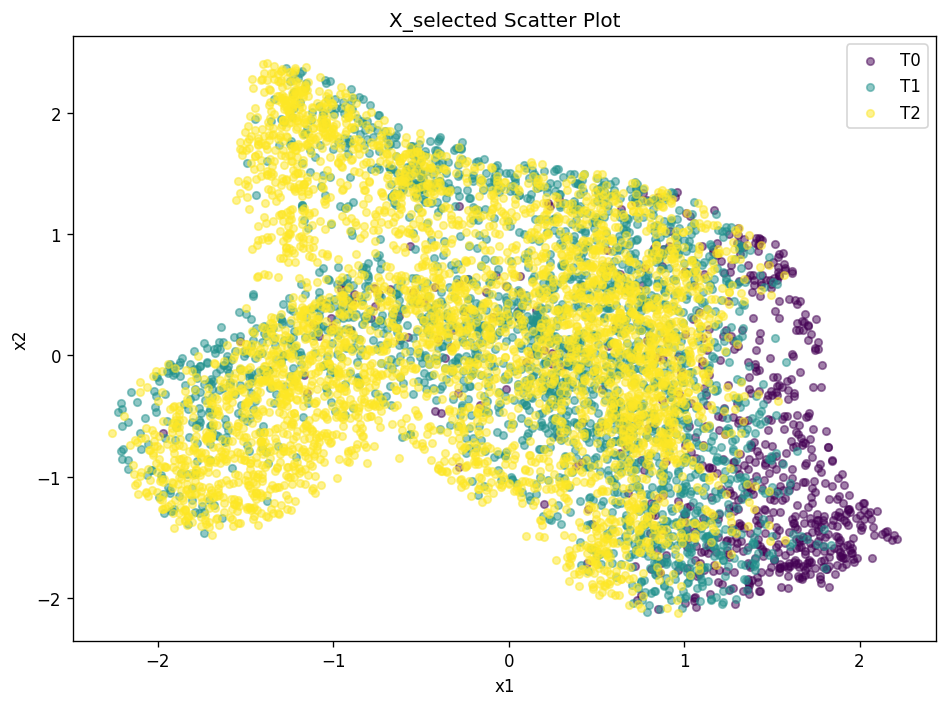

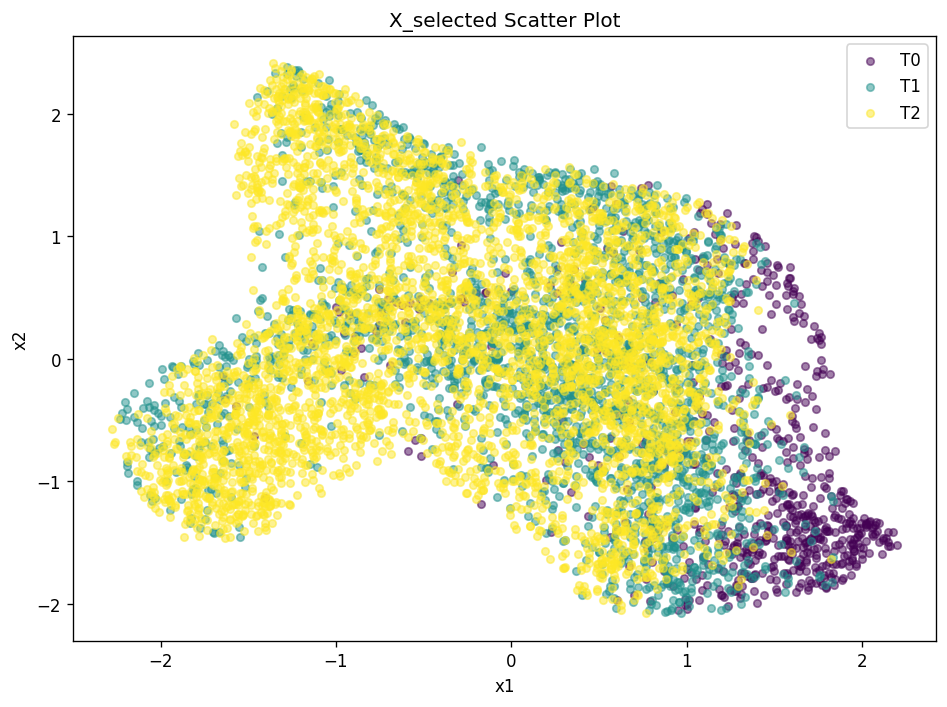

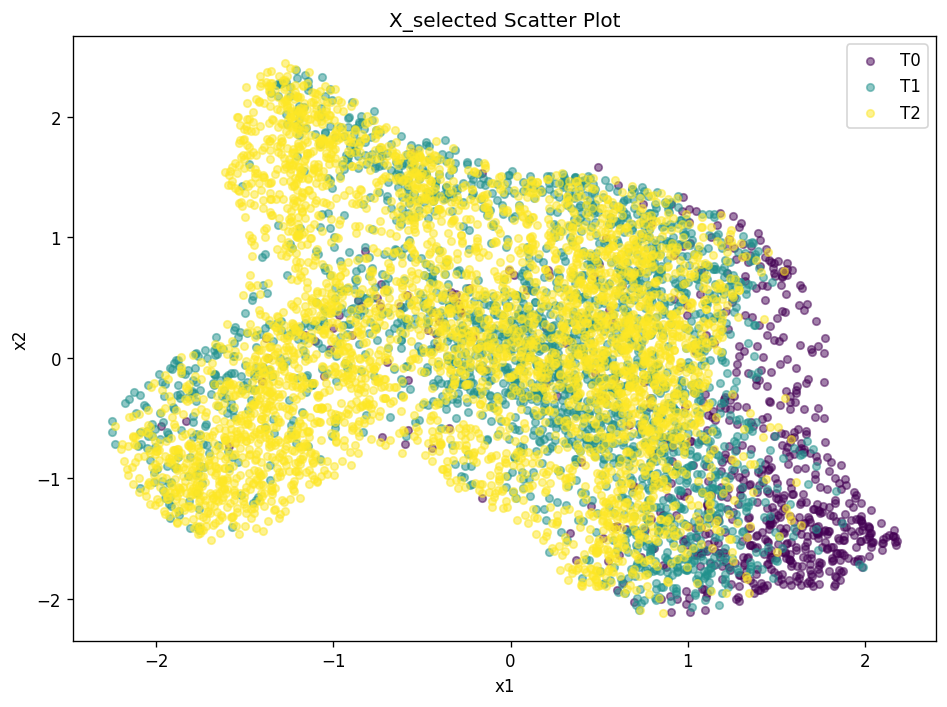

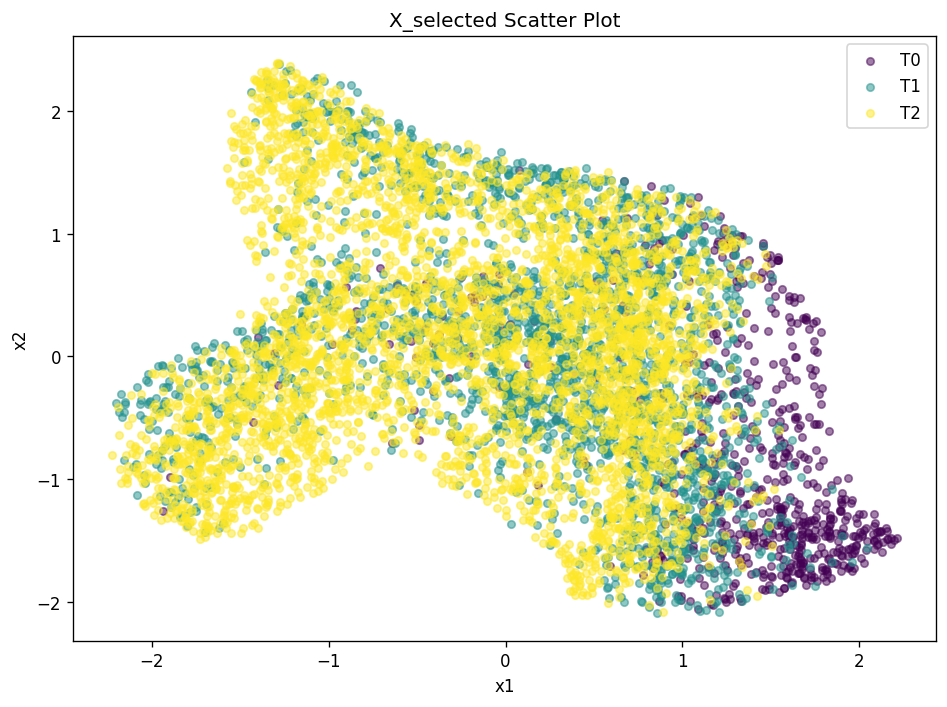

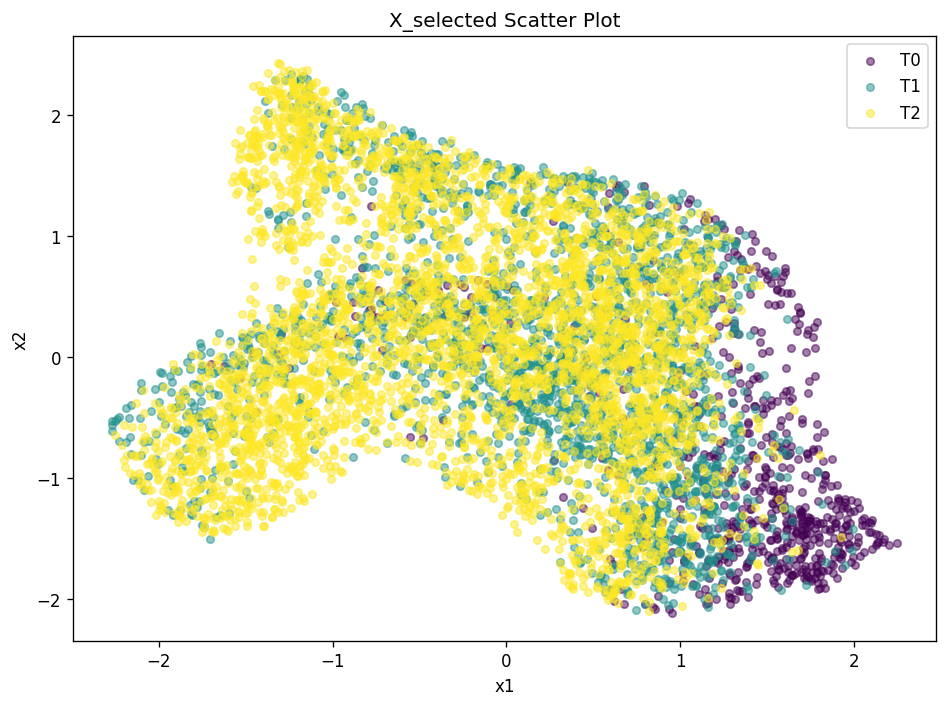

In [ ]:
X_subsets = split_X_into_subsets(X_selected, n_parts=5)
for i in range(len(X_subsets)):
    plot_X_selected(X_subsets[i], t_train)

In [41]:
print(X_subsets[0][i].shape for i in range(3))
X_subsets[0][2].shape

<generator object <genexpr> at 0x000001890585F300>


(4055, 2)

data_type: mouse2
t_train: [0, 1, 2]
hold out: None


Computing UOT plans...:   0%|          | 0/2 [00:00<?, ?it/s]

[✓] UOT plan computed for t=0 → t=1 with reg=0.5000


Computing UOT plans...: 100%|██████████| 2/2 [00:04<00:00,  2.53s/it]

[✓] UOT plan computed for t=1 → t=2 with reg=0.5000


Computing UOT plans...: 100%|██████████| 2/2 [00:04<00:00,  2.25s/it]


[✓] Saved all reg lists to config\mouse2\reg.yaml


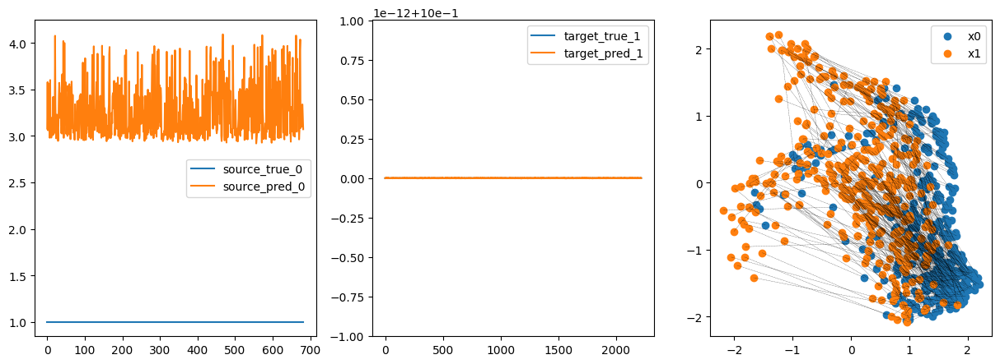

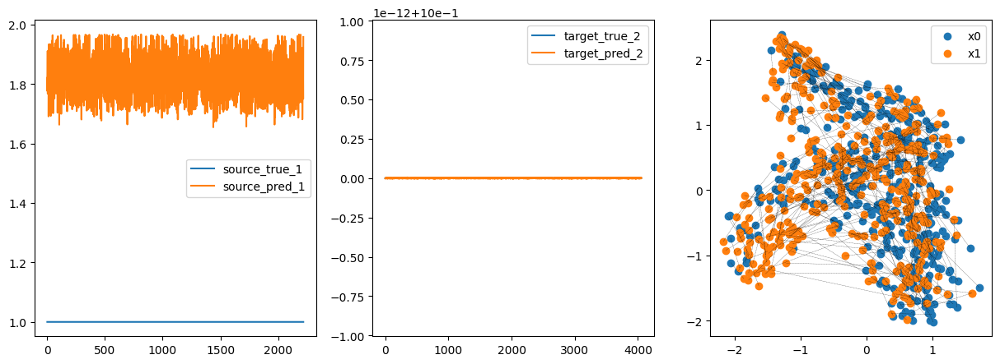

In [36]:
import os
import yaml
import torch
import pandas as pd
import numpy as np

hold_outs=[None]
reg_yaml_path = os.path.join("config", data_type, "reg.yaml")
os.makedirs(os.path.join("config", data_type), exist_ok=True)

# 如果文件已存在，先读取
if os.path.exists(reg_yaml_path):
    with open(reg_yaml_path, 'r') as f:
        reg_data = yaml.safe_load(f) or {}
else:
    reg_data = {}

for hold_out in hold_outs:
    print('data_type:', data_type)
    # df = pd.read_csv(f'data/{data_type}.csv')
    # time_labels = df['samples'].to_numpy()
    # data = df.iloc[:, 1:dim+1].to_numpy()

    # X = [data[time_labels == t] for t in np.unique(time_labels)]
    # X_selected = [data[time_labels == t] for t, v in enumerate(np.unique(time_labels)) if v != hold_out]
    # t_train = [i for i, v in enumerate(np.unique(time_labels)) if v != hold_out]

    print('t_train:', t_train)
    print('hold out:', hold_out)

    reg_m = [30,np.inf]
    uot_plans, reg_list = compute_uot_plans(
        X_subsets[1],
        t_train,
        reg_m=reg_m,
        draw=True,
        adaptive_reg=True,
        initial_reg=0.5,
        verbose=True
    )

    # ✅ 存入 dict
    reg_data[f"hold_out_{hold_out}"] = {
    'reg_list': [float(f"{r:.6f}") for r in reg_list],
    'reg_m': [reg_m[0],'.inf']  # 把 np.inf 转成可 YAML 表达的字符串
}


# 保存到 reg.yaml
with open(reg_yaml_path, 'w') as f:
    yaml.dump(reg_data, f, default_flow_style=False)

print(f"[✓] Saved all reg lists to {reg_yaml_path}")
